# Figure 5: OSCC

STEER package is imported
Loading datasets...
Scoring Training Slide for Arora Signatures...
Scoring Transfer Slide for Arora Signatures...
Generating Main Figure Panel (Sankey & Spatial Field)...


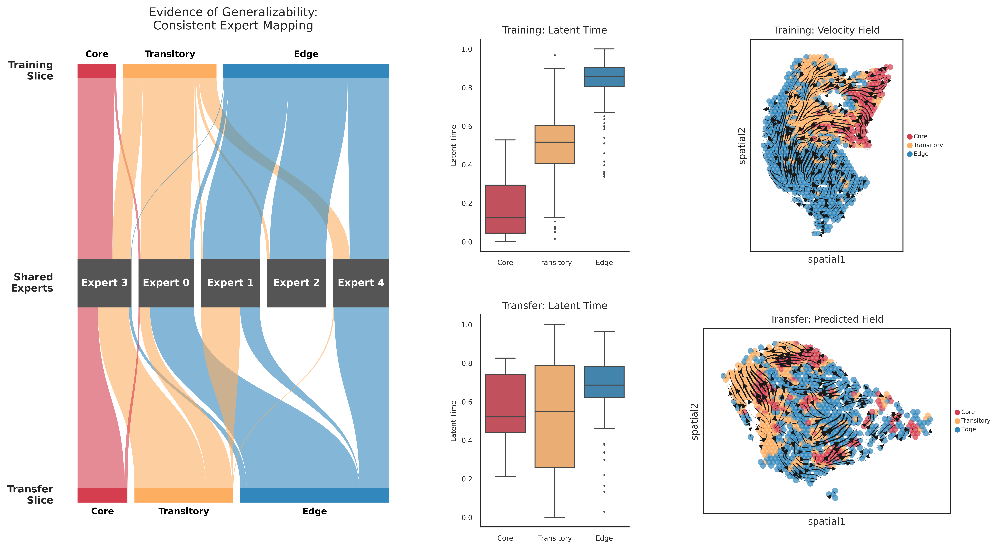

Saved: /nvme/users/liuzhy/Review_Files/NoteBook_Main_Figures/Results_Figure5/Figure_R2_Transferability_Optimized.pdf
Generating Arora Signatures Validation Panel...


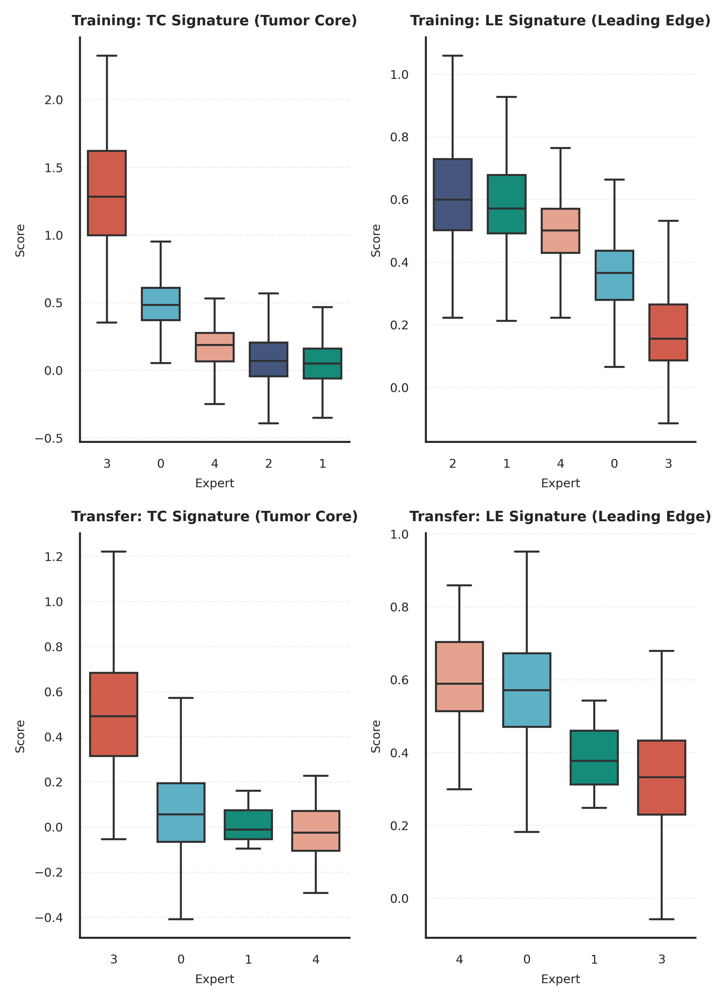

Saved: /nvme/users/liuzhy/Review_Files/NoteBook_Main_Figures/Results_Figure5/Arora_Signature_Validation_Combined.pdf
✅ All plots generated and saved successfully.


In [1]:
import os
import sys
import random
import warnings

import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.path as mpath
import matplotlib.gridspec as gridspec

import scanpy as sc
import scvelo as scv

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

from steer import us_transition_matrix
from steer import velocity_graph


# ==============================================================================
# 1. Configuration & Global Settings
# ==============================================================================
RESULT_PATH = '/nvme/users/liuzhy/Review_Files/NoteBook_Main_Figures/Results_Figure5/'
os.makedirs(RESULT_PATH, exist_ok=True)

# Set Reproducibility Seeds
SEED = 618
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# Global Plotting Settings
SPOT_SIZE = 150
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.figdir = RESULT_PATH
sc.settings.plot_prefix = ""
sc.settings.set_figure_params(dpi=300, fontsize=7, color_map='magma', frameon=True, vector_friendly=True, transparent=True)

scv.settings.figdir = RESULT_PATH
scv.settings.plot_prefix = ""
scv.set_figure_params(style='scvelo', dpi=300, fontsize=7, figsize=(5, 4), frameon=True, transparent=True)

sns.set_theme(
    context='paper', style='white', font_scale=1, 
    rc={"figure.dpi": 300, "axes.titlesize": 7, "axes.labelsize": 7, 
        "xtick.labelsize": 7, "ytick.labelsize": 7, "legend.fontsize": 6, 
        "lines.linewidth": 1, "grid.linewidth": 0.5}
)

# Advanced Color Palette for OSCC
COLOR_PALETTE = {
    'Core': '#D53E4F',       # Dark Red
    'Transitory': '#FDAE61', # Orange
    'Edge': '#3288BD',       # Dark Blue
    'Other': '#E6E6E6'       # Light Gray
}
TARGET_ORDER = ['Core', 'Transitory', 'Edge']

# ==============================================================================
# 2. Helper Functions
# ==============================================================================
def sync_and_color_data(adata, palette, order):
    """Format cluster annotations and normalize latent time."""
    key = 'cluster_annotations'
    if key in adata.obs:
        adata.obs[key] = adata.obs[key].astype(str).str.capitalize()
        unique_vals = adata.obs[key].unique()
        valid_cats = [c for c in order if c in unique_vals]
        remaining = [c for c in unique_vals if c not in valid_cats]
        final_order = valid_cats + remaining
        
        adata.obs[key] = adata.obs[key].astype('category')
        adata.obs[key] = adata.obs[key].cat.set_categories(final_order)
        adata.uns[f'{key}_colors'] = [palette.get(cat, '#AAAAAA') for cat in final_order]
    
    if 'Pred Time' in adata.obs:
        t = adata.obs['Pred Time']
        adata.obs['Pred Time'] = (t - t.min()) / (t.max() - t.min())

def draw_vertical_sankey(ax, adata_top, adata_bottom, top_anno='cluster_annotations', mid_col='Expert', bot_anno='cluster_annotations'):
    """Draw a vertical Sankey diagram with flow sorting to eliminate distortion."""
    # 1. Prepare data flows
    df_t = adata_top.obs[[top_anno, mid_col]].astype(str)
    flow_t = df_t.groupby([top_anno, mid_col]).size().reset_index(name='count')
    
    df_b = adata_bottom.obs[[mid_col, bot_anno]].astype(str)
    flow_b = df_b.groupby([mid_col, bot_anno]).size().reset_index(name='count')

    # 2. Node sorting
    t_nodes = TARGET_ORDER
    b_nodes = TARGET_ORDER
    all_experts = list(set(flow_t[mid_col]) | set(flow_b[mid_col]))
    
    priority_experts = ['3', '0', '1', '2', '4'] 
    
    def expert_sort_key(x):
        if x in priority_experts:
            return priority_experts.index(x)
        return len(priority_experts) + (int(x) if x.isdigit() else 999)
        
    m_nodes = sorted(all_experts, key=expert_sort_key)

    # 3. Layout calculation
    y_top, y_mid_top, y_mid_bot, y_bot = 0.95, 0.55, 0.45, 0.05
    bar_height, x_gap = 0.03, 0.02
    
    def calc_x_pos(nodes, counts_dict, total_w=0.9):
        col_total = sum([counts_dict.get(n, 0) for n in nodes])
        if col_total == 0: return {}, 1
        scale = (total_w - (len(nodes)-1)*x_gap) / col_total
        pos = {}
        curr_x = (1 - total_w) / 2
        for n in nodes:
            w = counts_dict.get(n, 0) * scale
            pos[n] = {'left': curr_x, 'right': curr_x + w, 'w': w, 'center': curr_x + w/2}
            curr_x += (w + x_gap)
        return pos, scale

    cnt_t = df_t[top_anno].value_counts().to_dict()
    cnt_b = df_b[bot_anno].value_counts().to_dict()
    cnt_m = df_t[mid_col].value_counts().to_dict()

    pos_t, scale_t = calc_x_pos(t_nodes, cnt_t)
    pos_b, scale_b = calc_x_pos(b_nodes, cnt_b)
    pos_m, scale_m = calc_x_pos(m_nodes, cnt_m)

    ax.axis('off')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    # 4. Draw vertical bands
    def draw_vertical_band(ax, x1_left, x1_right, x2_left, x2_right, y_top, y_bot, color, alpha=0.5):
        verts = [(x1_left, y_top), (x1_right, y_top), (x2_right, y_bot), (x2_left, y_bot)]
        cp_y1 = y_top - (y_top - y_bot) * 0.5
        cp_y2 = y_bot + (y_top - y_bot) * 0.5
        path = mpath.Path(
            [verts[0], (x1_left, cp_y1), (x2_left, cp_y2), verts[3], 
             verts[2], (x2_right, cp_y2), (x1_right, cp_y1), verts[1], verts[0]],
            [mpath.Path.MOVETO, mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.LINETO,
             mpath.Path.LINETO, mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.LINETO, mpath.Path.CLOSEPOLY]
        )
        patch = patches.PathPatch(path, facecolor=color, alpha=alpha, edgecolor='none')
        ax.add_patch(patch)

    off_t = {n: pos_t[n]['left'] for n in t_nodes if n in pos_t}
    off_m_in = {n: pos_m[n]['left'] for n in m_nodes if n in pos_m}
    
    # Train -> Expert 
    for t_n in t_nodes:
        if t_n not in pos_t: continue
        sub_flow = flow_t[flow_t[top_anno] == t_n].copy()
        
        # Sort to eliminate overlapping distortion
        sub_flow['sort_key'] = sub_flow[mid_col].map(expert_sort_key)
        sub_flow = sub_flow.sort_values('sort_key')
        
        for _, row in sub_flow.iterrows():
            m_n = row[mid_col]
            if m_n not in pos_m: continue
            val = row['count']
            
            w_start, w_end = val * scale_t, val * scale_m
            x1, x2 = off_t[t_n], off_m_in[m_n]
            color = COLOR_PALETTE.get(t_n, '#999')
            
            draw_vertical_band(ax, x1, x1+w_start, x2, x2+w_end, y_top-bar_height, y_mid_top, color, 0.6)
            off_t[t_n] += w_start
            off_m_in[m_n] += w_end

    # Expert -> Transfer
    off_m_out = {n: pos_m[n]['left'] for n in m_nodes if n in pos_m}
    off_b = {n: pos_b[n]['left'] for n in b_nodes if n in pos_b}
    
    for m_n in m_nodes:
        if m_n not in pos_m: continue
        sub_flow = flow_b[flow_b[mid_col] == m_n].copy()
        total_transfer = sub_flow['count'].sum()
        if total_transfer == 0: continue
        expert_vis_w = pos_m[m_n]['w']
        
        # Sort to align with target order
        sub_flow['sort_key'] = sub_flow[bot_anno].apply(lambda x: TARGET_ORDER.index(x) if x in TARGET_ORDER else 99)
        sub_flow = sub_flow.sort_values('sort_key')
        
        for _, row in sub_flow.iterrows():
            b_n = row[bot_anno]
            if b_n not in pos_b: continue
            val = row['count']
            
            w_start = (val / total_transfer) * expert_vis_w
            w_end = val * scale_b
            x1, x2 = off_m_out[m_n], off_b[b_n]
            color = COLOR_PALETTE.get(b_n, '#999')
            
            draw_vertical_band(ax, x1, x1+w_start, x2, x2+w_end, y_mid_bot, y_bot+bar_height, color, 0.6)
            off_m_out[m_n] += w_start
            off_b[b_n] += w_end

    # 5. Draw node bars and labels
    def draw_bars(pos_dict, y, layer_type):
        for n, p in pos_dict.items():
            if layer_type == 'expert':
                color = '#555555'
                rect = patches.Rectangle((p['left'], y_mid_bot), p['w'], y_mid_top - y_mid_bot, 
                                         facecolor=color, edgecolor='none', linewidth=0)
                ax.add_patch(rect)
                if p['w'] > 0.04:
                    ax.text(p['center'], (y_mid_top + y_mid_bot)/2, f"Expert {n}", 
                            ha='center', va='center', color='white', fontsize=10, fontweight='bold')
                elif p['w'] > 0.02:
                    ax.text(p['center'], (y_mid_top + y_mid_bot)/2, n, 
                            ha='center', va='center', color='white', fontsize=7)
            else:
                color = COLOR_PALETTE.get(n, '#999')
                rect = patches.Rectangle((p['left'], y), p['w'], bar_height, facecolor=color, edgecolor='none')
                ax.add_patch(rect)
                if layer_type == 'top':
                    ax.text(p['center'], y + bar_height + 0.01, n, ha='center', va='bottom', fontsize=9, fontweight='bold', color='black')
                else:
                    ax.text(p['center'], y - 0.01, n, ha='center', va='top', fontsize=9, fontweight='bold', color='black')

    draw_bars(pos_t, y_top - bar_height, 'top')
    draw_bars(pos_m, 0, 'expert')
    draw_bars(pos_b, y_bot, 'bot')

    ax.text(-0.02, y_top - bar_height/2, "Training\nSlice", ha='right', va='center', fontsize=10, fontweight='bold')
    ax.text(-0.02, (y_mid_top+y_mid_bot)/2, "Shared\nExperts", ha='right', va='center', fontsize=10, fontweight='bold')
    ax.text(-0.02, y_bot + bar_height/2, "Transfer\nSlice", ha='right', va='center', fontsize=10, fontweight='bold')

def rasterize_flow_field(ax):
    """Selectively rasterize scatter points and flow arrows to keep file size small while maintaining vector labels."""
    for collection in ax.collections:
        collection.set_rasterized(True)
    for patch in ax.patches:
        patch.set_rasterized(True)
    for line in ax.lines:
        line.set_rasterized(True)

def plot_sorted_boxplot(adata, score_name, title, ax):
    """Plot boxplots ordered by descending median score."""
    if 'Expert' in adata.obs.columns:
        adata.obs['Expert'] = adata.obs['Expert'].astype(str)
        
    group_order = adata.obs.groupby('Expert')[score_name].median().sort_values(ascending=False).index.tolist()
    
    EXPERT_PALETTE = {'3': '#E64B35', '0': '#4DBBD5', '1': '#00A087', '2': '#3C5488', '4': '#F39B7F', '5': '#91D1C2'}
    
    sns.boxplot(
        data=adata.obs, x='Expert', y=score_name, 
        order=group_order, palette=EXPERT_PALETTE,
        ax=ax, showfliers=False, linewidth=1.0, width=0.7
    )
    
    ax.set_title(title, fontsize=7, fontweight='bold')
    ax.set_xlabel("Expert", fontsize=6)
    ax.set_ylabel("Score", fontsize=6)
    ax.tick_params(axis='both', labelsize=6)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    sns.despine(ax=ax)

# ==============================================================================
# 3. Data Processing & Gene Scoring
# ==============================================================================
print("Loading datasets...")
adata_train = sc.read_h5ad('/nvme/users/liuzhy/Review_Files/NoteBook_Main_Figures/Data4NoteBook/Figure5_OSCC_S2.h5ad')
adata_transfer = sc.read_h5ad('/nvme/users/liuzhy/Review_Files/NoteBook_Main_Figures/Data4NoteBook/Figure5_OSCC_S5_zeroshot.h5ad')

sync_and_color_data(adata_train, COLOR_PALETTE, TARGET_ORDER)
sync_and_color_data(adata_transfer, COLOR_PALETTE, TARGET_ORDER)

arora_sigs = {
    'Arora_TC_Score': [
        'SPRR2E', 'CRCT1', 'SPRR2D', 'CNFN', 'SPRR1A', 'SPRR2A', 'SLURP2', 'LCE3D', 
        'SPRR2B', 'SPRR3', 'SLURP1', 'SPRR2G', 'S100A12', 'LCN2', 'FAM25A', 'PI3', 
        'KLK6', 'DEFB4A', 'SPRR1B', 'S100A7', 'LCE3E', 'CSTA', 'KLK7', 'SBSN', 'KLK13'
    ],
    'Arora_LE_Score': [
        'COL1A1', 'COL1A2', 'MT2A', 'NME2', 'IFITM3', 'VIM', 'PFN1', 'RPS23', 
        'RPL4', 'RPL34', 'PKM', 'RPS27A', 'MT1X', 'RPL11', 'ATP1A1', 'PTMA', 
        'RPS2', 'RPL5', 'RPS4X', 'TUBB', 'MIR205HG', 'TUBA1B', 'RPL17', 'RPL22', 'HNRNPA2B1'
    ]
}

datasets = {'Training': adata_train, 'Transfer': adata_transfer}
for name, adata_obj in datasets.items():
    print(f"Scoring {name} Slide for Arora Signatures...")
    for sig_name, genes in arora_sigs.items():
        valid_genes = [g for g in genes if g in adata_obj.var_names]
        sc.tl.score_genes(adata_obj, gene_list=valid_genes, score_name=sig_name)

# ==============================================================================
# 4. Plotting Panel 1: Vertical Sankey & Spatial Velocities
# ==============================================================================
print("Generating Main Figure Panel (Sankey & Spatial Field)...")
fig1 = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(2, 3, width_ratios=[1.4, 0.6, 1.0], wspace=0.3, hspace=0.3)

# 4.1 Sankey Diagram (Left)
ax_sankey = fig1.add_subplot(gs[:, 0]) 
draw_vertical_sankey(ax_sankey, adata_train, adata_transfer)
ax_sankey.set_title("Evidence of Generalizability:\nConsistent Expert Mapping", fontsize=12, pad=10)

# 4.2 Training Slide Plots (Top Right)
ax_box_train = fig1.add_subplot(gs[0, 1])
ax_vel_train = fig1.add_subplot(gs[0, 2])

sns.boxplot(
    data=adata_train.obs, x='cluster_annotations', y='Pred Time', 
    palette=COLOR_PALETTE, ax=ax_box_train, order=TARGET_ORDER, linewidth=1, fliersize=1
)
ax_box_train.set_title('Training: Latent Time', fontsize=10)
ax_box_train.set_xlabel('')
ax_box_train.set_ylabel('Latent Time')
sns.despine(ax=ax_box_train)

scv.pl.velocity_embedding_stream(
    adata_train, basis='spatial', vkey='pred_vs_norm', title='Training: Velocity Field',
    color='cluster_annotations', alpha=0.7, size=SPOT_SIZE-20, legend_loc='right', add_margin=0.1,
    palette=COLOR_PALETTE, ax=ax_vel_train, show=False
)
ax_vel_train.set_aspect('equal')

# 4.3 Transfer Slide Plots (Bottom Right)
ax_box_transfer = fig1.add_subplot(gs[1, 1])
ax_vel_transfer = fig1.add_subplot(gs[1, 2])

sns.boxplot(
    data=adata_transfer.obs, x='cluster_annotations', y='Pred Time', 
    palette=COLOR_PALETTE, ax=ax_box_transfer, order=TARGET_ORDER, linewidth=1, fliersize=1
)
ax_box_transfer.set_title('Transfer: Latent Time', fontsize=10)
ax_box_transfer.set_xlabel('')
ax_box_transfer.set_ylabel('Latent Time')
sns.despine(ax=ax_box_transfer)

scv.pl.velocity_embedding_stream(
    adata_transfer, basis='spatial', vkey='pred_vs_norm', title='Transfer: Predicted Field',
    color='cluster_annotations', alpha=0.7, size=SPOT_SIZE, legend_loc='right',
    add_margin=0.1, palette=COLOR_PALETTE, ax=ax_vel_transfer, show=False
)
ax_vel_transfer.set_aspect('equal')

# Rasterize heavy scatter/quiver objects
rasterize_flow_field(ax_vel_train)
rasterize_flow_field(ax_vel_transfer)

save_filename_1 = os.path.join(RESULT_PATH, "Figure_R2_Transferability_Optimized.pdf")
plt.savefig(save_filename_1, dpi=300, bbox_inches='tight')
plt.show()
print(f"Saved: {save_filename_1}")

# ==============================================================================
# 5. Plotting Panel 2: Arora Signatures Validation
# ==============================================================================
print("Generating Arora Signatures Validation Panel...")
fig2, axes2 = plt.subplots(2, 2, figsize=(5, 7))

plot_sorted_boxplot(adata_train, 'Arora_TC_Score', "Training: TC Signature (Tumor Core)", axes2[0, 0])
plot_sorted_boxplot(adata_train, 'Arora_LE_Score', "Training: LE Signature (Leading Edge)", axes2[0, 1])
plot_sorted_boxplot(adata_transfer, 'Arora_TC_Score', "Transfer: TC Signature (Tumor Core)", axes2[1, 0])
plot_sorted_boxplot(adata_transfer, 'Arora_LE_Score', "Transfer: LE Signature (Leading Edge)", axes2[1, 1])

plt.tight_layout()
save_filename_2 = os.path.join(RESULT_PATH, "Arora_Signature_Validation_Combined.pdf")
plt.savefig(save_filename_2, dpi=300, bbox_inches='tight')
plt.show()
print(f"Saved: {save_filename_2}")

print("✅ All plots generated and saved successfully.")

Loading Mature Brain data...
Generating Pie Charts...


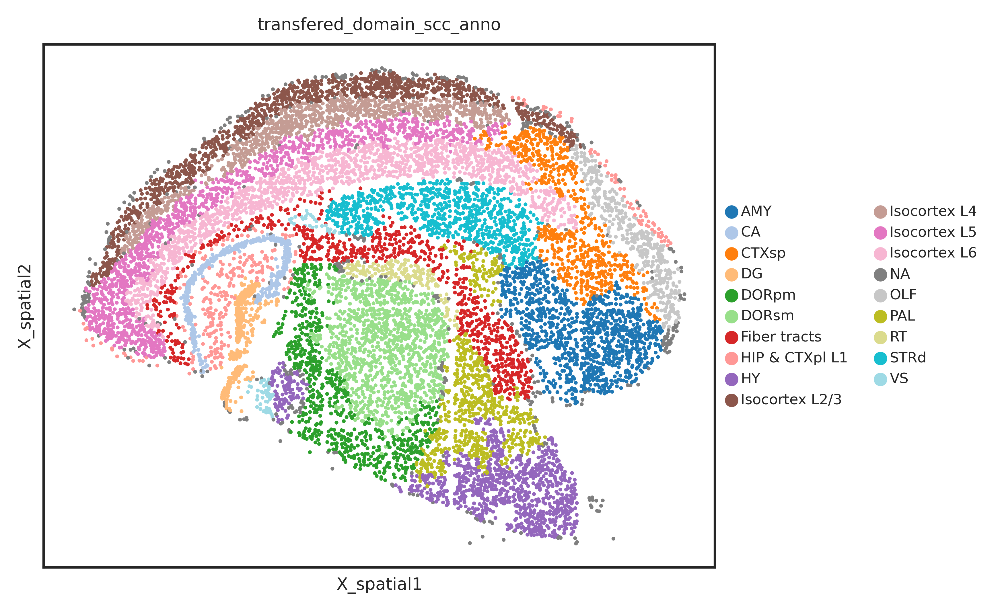

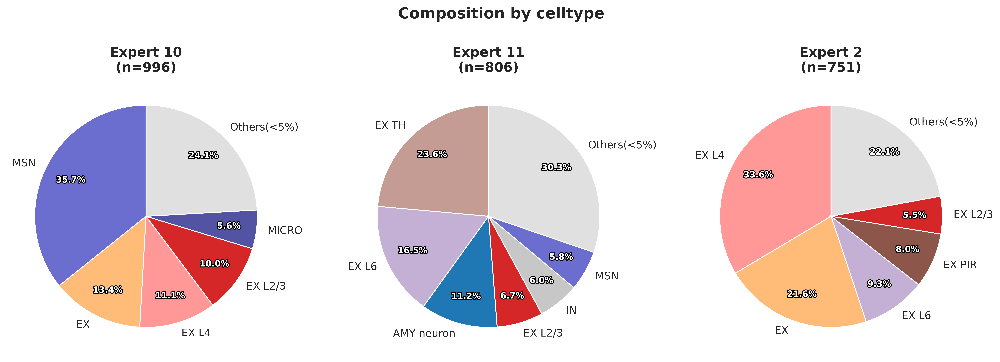

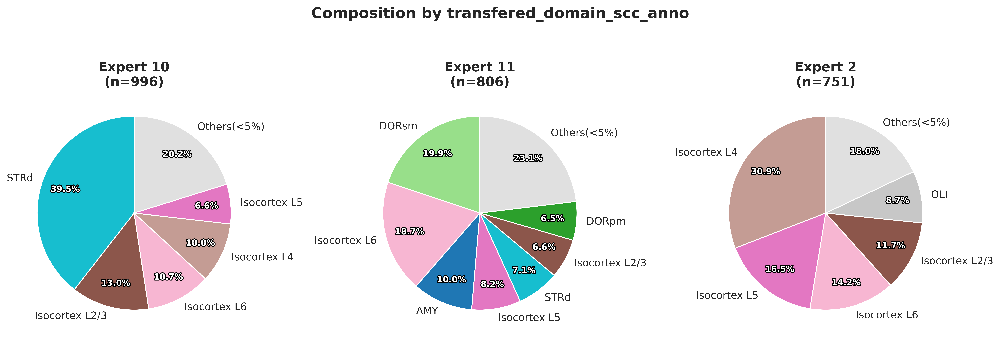

Generating Stacked Bar Chart for Cell Type Composition...


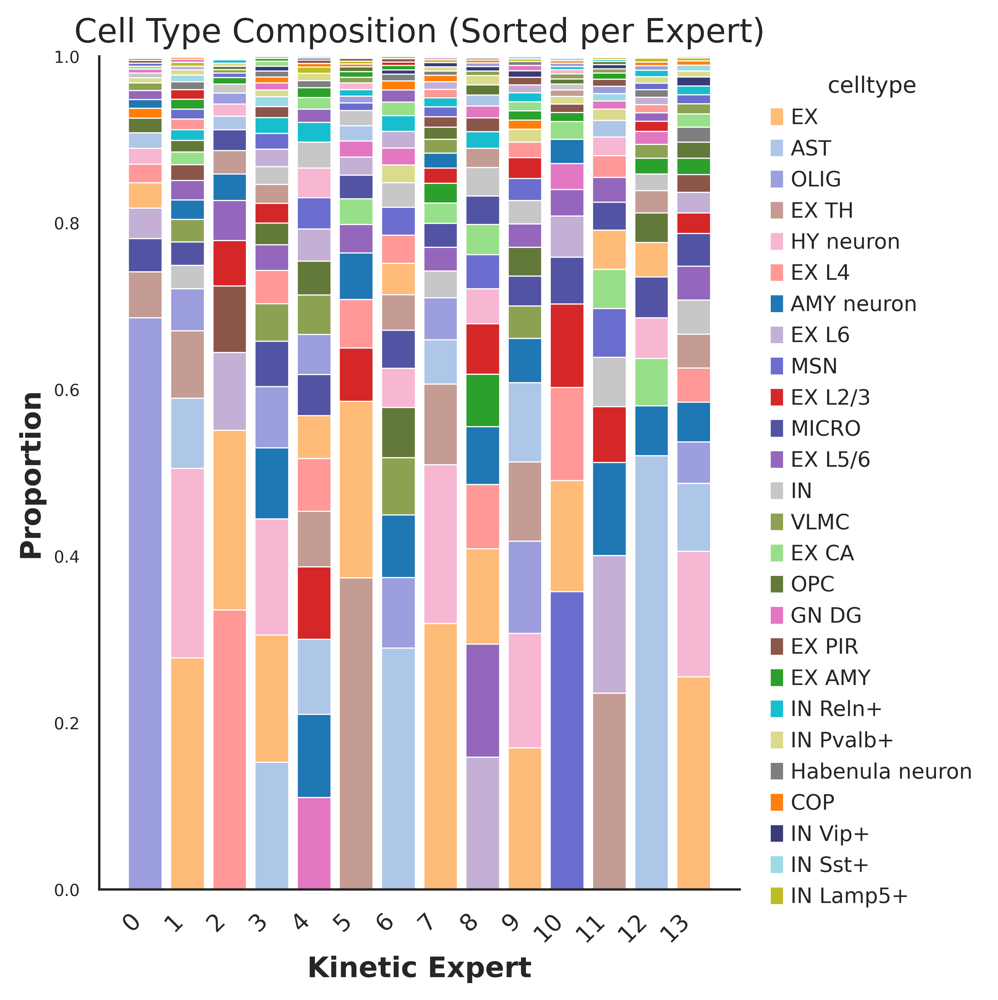

Calculating Signature Scores & Generating Clustermap...


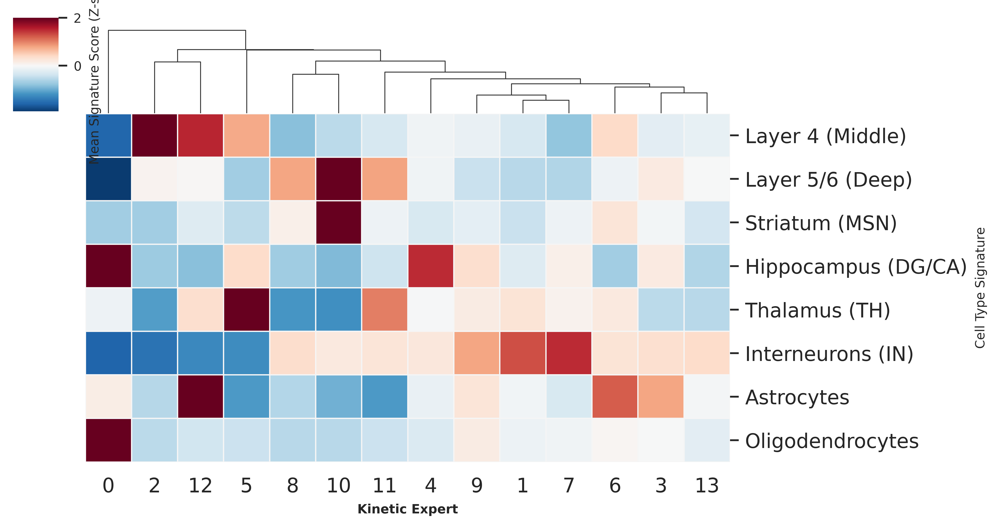

Computing Global US Transition Matrix...
Computing Neighbors and Velocity Graph...
computing velocity graph (using 1/128 cores)


  0%|          | 0/11854 [00:00<?, ?cells/s]

    finished (0:00:25) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Plotting Velocity Streams for Experts: ['10', '11', '2']...
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)


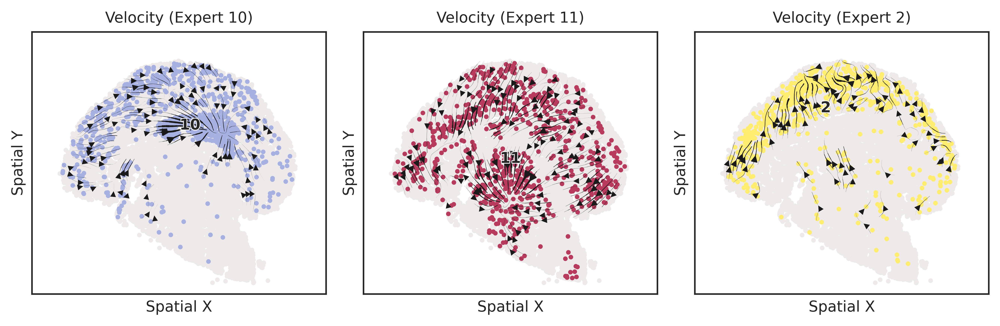

Generating Transition Graphs for Experts: ['10', '11', '2']...


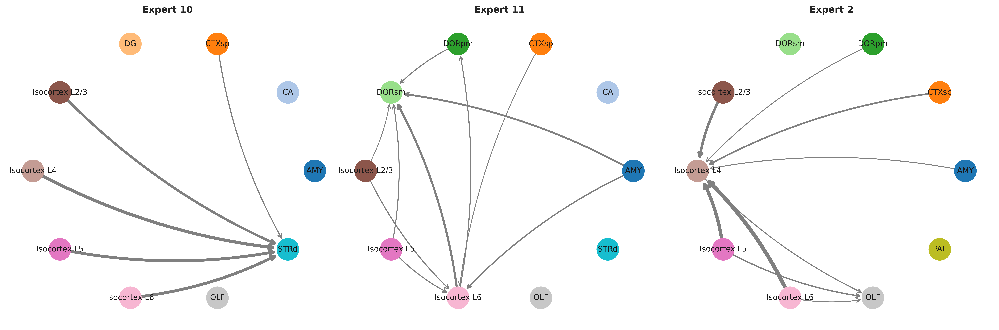

✅ All Figure 5 analyses generated and saved successfully!


In [2]:
import os
import math
import random
import warnings
from itertools import cycle, islice

import numpy as np
import pandas as pd
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.patheffects as path_effects

import scanpy as sc
import scvelo as scv

# Assuming `us_transition_matrix` and `velocity_graph` are from your custom `steer` module
from steer import us_transition_matrix, velocity_graph

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# ==============================================================================
# 1. Configuration & Global Settings
# ==============================================================================
RESULT_PATH = '/nvme/users/liuzhy/Review_Files/NoteBook_Main_Figures/Results_Figure5/'
os.makedirs(RESULT_PATH, exist_ok=True)

# Target Experts to visualize
TARGET_EXPERTS = ['10', '11', '2']

# Global Plotting Settings
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.figdir = RESULT_PATH
sc.settings.plot_prefix = ""
sc.settings.set_figure_params(
    dpi=300, fontsize=7, color_map='magma', 
    frameon=True, vector_friendly=True, transparent=True, figsize=(3, 3)
)

scv.settings.figdir = RESULT_PATH
scv.settings.plot_prefix = ""
scv.set_figure_params(style='scvelo', dpi=300, fontsize=7, figsize=(5, 4), frameon=True, transparent=True)

sns.set_theme(
    context='paper', style='white', font_scale=1, 
    rc={"figure.dpi": 300, "axes.titlesize": 7, "axes.labelsize": 7, 
        "xtick.labelsize": 7, "ytick.labelsize": 7, "legend.fontsize": 6, 
        "lines.linewidth": 1, "grid.linewidth": 0.5}
)

# ==============================================================================
# 2. Data Loading & Preprocessing
# ==============================================================================
print("Loading Mature Brain data...")
adata = sc.read_h5ad("/nvme/users/liuzhy/Review_Files/NoteBook_Main_Figures/Data4NoteBook/Figure5_Mature_Brain.h5ad")

def expert_color_add(adata, obs_key):
    """Assign specific colors to the Expert annotations."""
    color_list = [
        "#8DD3C7", '#1F78B4', "#FFED6F", "#FB8072", "#80B1D3", 
        "#FDB462", "#B3DE69", "#FCCDE5", '#b83ba7', "#BC80BD",
        '#A6B1E1', '#B83B5E', '#5e77e4', "#D9D9D9"
    ]
    k = adata.obs[obs_key].nunique()
    adata.uns[f'{obs_key}_colors'] = color_list[:k]
    return adata

adata = expert_color_add(adata, 'Expert')

# Build color mappings for annotations
color_maps = {}
# A. Celltype: Alphabetical sort + expanded palette
all_celltypes_sorted = sorted(adata.obs['celltype'].unique().astype(str))
colors_extended = list(plt.cm.tab20.colors) + list(plt.cm.tab20b.colors) + list(plt.cm.tab20c.colors)
color_maps['celltype'] = {ctype: colors_extended[i % len(colors_extended)] for i, ctype in enumerate(all_celltypes_sorted)}

# B. Domain: Force Scanpy computation and read from adata.uns
domain_col = 'transfered_domain_scc_anno'
sc.pl.embedding(adata, basis='X_spatial', color=domain_col, palette='tab20', show=False)
uns_key = f"{domain_col}_colors"

if uns_key in adata.uns:
    if not isinstance(adata.obs[domain_col].dtype, pd.CategoricalDtype):
        adata.obs[domain_col] = adata.obs[domain_col].astype('category')
    domain_cats = adata.obs[domain_col].cat.categories
    color_maps[domain_col] = dict(zip(domain_cats, adata.uns[uns_key]))
else:
    domain_cats = sorted(adata.obs[domain_col].unique())
    color_maps[domain_col] = {c: plt.cm.tab20.colors[i % 20] for i, c in enumerate(domain_cats)}

# ==============================================================================
# 3. Aggregated Pie Charts for Target Experts
# ==============================================================================
def plot_expert_pies_aggregated(adata, target_experts, anno_col, color_map):
    """Plot composition pie charts, aggregating minor groups into 'Others(<5%)'."""
    df = adata.obs[adata.obs['Expert'].isin(target_experts)].copy()
    fig, axes = plt.subplots(1, len(target_experts), figsize=(5 * len(target_experts), 5))
    if len(target_experts) == 1: axes = [axes]
    
    fig.suptitle(f"Composition by {anno_col}", fontsize=16, fontweight='bold', y=1.05)
    threshold = 0.05 
    others_color = '#E0E0E0' 

    for ax, expert in zip(axes, target_experts):
        subset = df[df['Expert'] == expert]
        if subset.empty:
            ax.axis('off'); continue
            
        counts = subset[anno_col].value_counts(normalize=True)
        major_mask = counts >= threshold
        major_counts = counts[major_mask]
        minor_sum = counts[~major_mask].sum()
        
        plot_labels = list(major_counts.index.astype(str))
        plot_sizes = list(major_counts.values)
        plot_colors = [color_map.get(l, '#d3d3d3') for l in plot_labels]
        
        if minor_sum > 0:
            plot_labels.append("Others(<5%)")
            plot_sizes.append(minor_sum)
            plot_colors.append(others_color)
        
        wedges, texts, autotexts = ax.pie(
            plot_sizes, labels=plot_labels, autopct='%1.1f%%', startangle=90, 
            colors=plot_colors, labeldistance=1.1, pctdistance=0.75,
            wedgeprops={'linewidth': 1, 'edgecolor': 'white'}, textprops={'fontsize': 11}
        )
        
        # Format internal percentages
        plt.setp(autotexts, size=9, weight="bold", color="white")
        for txt in autotexts:
            txt.set_path_effects([path_effects.withStroke(linewidth=2, foreground='black')])
            
        ax.set_title(f"Expert {expert}\n(n={len(subset)})", fontsize=14, fontweight='bold')

    plt.tight_layout()
    filename = os.path.join(RESULT_PATH, f"Pie_Aggregated_{anno_col}.pdf")
    plt.savefig(filename, bbox_inches='tight')
    plt.show()

print("Generating Pie Charts...")
for col in ['celltype', 'transfered_domain_scc_anno']:
    if col in color_maps:
        plot_expert_pies_aggregated(adata, TARGET_EXPERTS, col, color_maps[col])

# ==============================================================================
# 4. Stacked Bar Charts (Cell Type Composition)
# ==============================================================================
print("Generating Stacked Bar Chart for Cell Type Composition...")
df_cross = pd.crosstab(adata.obs['Expert'], adata.obs['celltype'])
df_prop = df_cross.div(df_cross.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(6, 6))
experts = df_prop.index.tolist()
x_pos = np.arange(len(experts))

for i, expert in enumerate(experts):
    row_sorted = df_prop.loc[expert].sort_values(ascending=False)
    row_sorted = row_sorted[row_sorted > 0]
    
    bottom = 0
    for ctype, prop in row_sorted.items():
        ax.bar(
            i, prop, bottom=bottom, color=color_maps['celltype'][ctype], 
            edgecolor='white', linewidth=0.5, width=0.8
        )
        bottom += prop

ax.grid(False)
sns.despine(ax=ax, top=True, right=True, left=False, bottom=False)
ax.set_xticks(x_pos)
ax.set_xticklabels(experts, fontsize=10, rotation=45, ha='right')
ax.set_xlabel("Kinetic Expert", fontsize=12, fontweight='bold')
ax.set_ylabel("Proportion", fontsize=12, fontweight='bold')
ax.set_title("Cell Type Composition (Sorted per Expert)", fontsize=14)
ax.set_ylim(0, 1)

# Generate ordered legend
sorted_celltypes_legend = df_prop.sum().sort_values(ascending=False).index.tolist()
legend_handles = [mpatches.Patch(color=color_maps['celltype'][ctype], label=ctype) for ctype in sorted_celltypes_legend]
ax.legend(handles=legend_handles, bbox_to_anchor=(1.02, 1), loc='upper left', title='celltype', fontsize=9, frameon=False)

plt.tight_layout()
plt.savefig(os.path.join(RESULT_PATH, "StackedBar_Clean_celltype.pdf"), bbox_inches='tight')
plt.show()

# Save Top 3 stats to CSV
stats_list = []
for expert in df_prop.index:
    sorted_s = df_prop.loc[expert].sort_values(ascending=False)
    top1 = f"{sorted_s.index[0]} ({sorted_s.values[0]:.1%})"
    top2 = f"{sorted_s.index[1]} ({sorted_s.values[1]:.1%})" if len(sorted_s) > 1 else ""
    top3 = f"{sorted_s.index[2]} ({sorted_s.values[2]:.1%})" if len(sorted_s) > 2 else ""
    stats_list.append({'Expert': expert, 'Top 1': top1, 'Top 2': top2, 'Top 3': top3})

pd.DataFrame(stats_list).to_csv(os.path.join(RESULT_PATH, "Expert_Composition_Top3.csv"), index=False)

# ==============================================================================
# 5. Marker Signatures & Clustermap
# ==============================================================================
print("Calculating Signature Scores & Generating Clustermap...")
marker_signatures = {
    'Layer 2/3 (Upper)': ['Cux2', 'Calb1', 'Lamp5', 'Satb2'], 
    'Layer 4 (Middle)': ['Rorb', 'Rspo1', 'Thsd7a'], 
    'Layer 5/6 (Deep)': ['Bcl11b', 'Fezf2', 'Tle4', 'Foxp2', 'Syt6'],
    'Striatum (MSN)': ['Ppp1r1b', 'Drd1', 'Drd2', 'Penk', 'Tac1'],
    'Hippocampus (DG/CA)': ['Prox1', 'Wfs1', 'Fibcd1'],
    'Thalamus (TH)': ['Gbx2', 'Prkcd', 'Tcf7l2'],
    'Interneurons (IN)': ['Gad1', 'Gad2', 'Pvalb', 'Sst', 'Vip'],
    'Astrocytes': ['Aqp4', 'Slc1a2', 'Gfap', 'Aldoc'],
    'Microglia': ['P2ry12', 'C1qa', 'C1qb', 'Cx3cr1'],
    'Oligodendrocytes': ['Mbp', 'Plp1', 'Mog', 'Mag', 'Pdgfra', 'Cspg4']
}

score_names = []
for name, genes in marker_signatures.items():
    valid_genes = [g for g in genes if g in adata.var_names]
    if valid_genes:
        sc.tl.score_genes(adata, gene_list=valid_genes, score_name=name)
        score_names.append(name)

score_df = adata.obs[['Expert'] + score_names].groupby('Expert').mean()
score_df_z = (score_df - score_df.mean()) / score_df.std()
plot_df = score_df_z.clip(lower=-2.0, upper=2.0).T 

g = sns.clustermap(
    plot_df, col_cluster=True, row_cluster=False, cmap='RdBu_r', center=0,
    figsize=(7, 4), linewidths=0.5, linecolor='whitesmoke',
    cbar_kws={'label': 'Mean Signature Score (Z-score)'}, dendrogram_ratio=(0.1, 0.2)
)

g.ax_heatmap.set_xlabel("Kinetic Expert", fontsize=7, fontweight='bold')
g.ax_heatmap.set_ylabel("Cell Type Signature", fontsize=7)
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=0, fontsize=11)
plt.setp(g.ax_heatmap.get_yticklabels(), fontsize=11)

plt.savefig(os.path.join(RESULT_PATH, "Heatmap_Module_Scores.pdf"), bbox_inches='tight')
plt.show()

# ==============================================================================
# 6. Global Velocity Graph & Embedding Streams (Target Experts)
# ==============================================================================
print("Computing Global US Transition Matrix...")
combined_adata = us_transition_matrix(
    adata, velocity_u_key='pred_vu_norm', velocity_s_key='pred_vs_norm',
    unspliced_key='model_Mu', spliced_key='model_Ms'
)
combined_adata = expert_color_add(combined_adata, 'Expert')

print("Computing Neighbors and Velocity Graph...")
sc.pp.neighbors(combined_adata, use_rep='X_refine_embed', n_neighbors=30)
velocity_graph(combined_adata, vkey='velocity', xkey='used_Mu_Ms')

print(f"Plotting Velocity Streams for Experts: {TARGET_EXPERTS}...")
unique_experts = combined_adata.obs['Expert'].cat.categories.tolist() if isinstance(combined_adata.obs['Expert'].dtype, pd.CategoricalDtype) else combined_adata.obs['Expert'].unique().tolist()
palette_full = {ex: combined_adata.uns['Expert_colors'][i % len(combined_adata.uns['Expert_colors'])] for i, ex in enumerate(unique_experts)}

ncols = len(TARGET_EXPERTS)
fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(3 * ncols, 3), sharex=True, sharey=True)
if ncols == 1: axes = [axes]

for i, expert_name in enumerate(TARGET_EXPERTS):
    ax = axes[i]
    new_key = 'Expert_iter'
    combined_adata.obs[new_key] = combined_adata.obs['Expert'].apply(lambda x: 'CurrentExpert' if str(x) == expert_name else 'OtherExperts')

    # Base stream
    scv.pl.velocity_embedding_stream(
        combined_adata, basis='spatial', groups=[expert_name], color='Expert',
        smooth=0.75, min_mass=3.5, size=25, add_margin=0.15, alpha=1, arrow_size=0.9, 
        linewidth=0.7, ax=ax, frameon=True, show=False, title=f'Velocity (Expert {expert_name})'
    )

    # Background scatter (Other Experts)
    scv.pl.scatter(
        combined_adata[combined_adata.obs[new_key] == 'OtherExperts'], basis='spatial',
        color=new_key, palette={'OtherExperts': '#eeeaea'}, size=35, alpha=1,
        edgecolor='none', zorder=1, legend_loc='none', ax=ax, show=False
    )

    # Foreground scatter (Current Expert)
    scv.pl.scatter(
        combined_adata[combined_adata.obs[new_key] == 'CurrentExpert'], basis='spatial',
        color=new_key, palette={'CurrentExpert': palette_full.get(expert_name, '#000000')},
        size=35, alpha=1, edgecolor='none', legend_loc='none', zorder=2, ax=ax, show=False,
        title=f'Velocity (Expert {expert_name})', xlabel='Spatial X', ylabel='Spatial Y'
    )

plt.tight_layout()
plt.savefig(os.path.join(RESULT_PATH, "expert_velocity_subset.pdf"), dpi=300)
plt.show()

# ==============================================================================
# 7. Transition Graphs (NetworkX) for Target Experts
# ==============================================================================
print(f"Generating Transition Graphs for Experts: {TARGET_EXPERTS}...")

def init_global_colors(adata, key: str, palette="tab20"):
    """Generate and store categorical color mappings."""
    if f"{key}_colors" in adata.uns: return
    cats = list(adata.obs[key].astype("category").cat.categories)
    cmap = cm.get_cmap(palette, len(cats))
    base_colors = [mcolors.to_hex(cmap(i)) for i in range(len(cats))]
    adata.uns[f"{key}_categories"] = cats
    adata.uns[f"{key}_colors"] = base_colors
    adata.uns[f"{key}_cat2color"] = dict(zip(cats, base_colors))

def compute_group_net_flow_global(T, adata_full, cells_idx, group_key, topk=3):
    """Compute net transition flow between top groups."""
    sub_obs = adata_full.obs[group_key].iloc[cells_idx]
    topk_labels = sub_obs.value_counts(normalize=True).head(topk).index

    mask_topk = adata_full.obs[group_key].isin(topk_labels)
    idx_kept = np.intersect1d(cells_idx, np.where(mask_topk)[0])

    groups = adata_full.obs[group_key].iloc[idx_kept].values
    unique_groups = np.unique(groups)
    idx_map = {g: np.where(groups == g)[0] for g in unique_groups}

    flow = pd.DataFrame(0.0, index=unique_groups, columns=unique_groups)
    for g_from in unique_groups:
        rows_global = idx_kept[idx_map[g_from]]
        Tsub = T[rows_global, :]
        for g_to in unique_groups:
            cols_global = idx_kept[idx_map[g_to]]
            flow.loc[g_from, g_to] = Tsub[:, cols_global].sum()

    return flow - flow.T

def draw_net_flow_on_ax(net_flow_df, ax, cat2color_map, threshold=0.01, scale=5, title=None):
    """Draw directed transition graph."""
    G = nx.DiGraph()
    for node in net_flow_df.index: G.add_node(node)
    for i in net_flow_df.index:
        for j in net_flow_df.columns:
            w = net_flow_df.loc[i, j]
            if w > threshold: G.add_edge(i, j, weight=w)
                
    pos = nx.circular_layout(G)
    node_size = 800
    nx.draw_networkx_nodes(G, pos, node_color=[cat2color_map.get(n, '#CCC') for n in net_flow_df.index], node_size=node_size, ax=ax)
    
    widths = [G[u][v]['weight'] * scale for u, v in G.edges()]
    nx.draw_networkx_edges(
        G, pos, arrowstyle='->', arrowsize=12, width=widths, edge_color='grey',
        connectionstyle='arc3,rad=0.1', node_size=node_size, min_source_margin=15, min_target_margin=15, ax=ax
    )
    nx.draw_networkx_labels(G, pos, font_size=10, ax=ax)
    if title: ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_axis_off()

# Compute global transition matrix
T_global = scv.utils.get_transition_matrix(combined_adata, basis='X_refine_embed')

init_global_colors(combined_adata, key="transfered_domain_scc_anno", palette="tab20")
cat2color = combined_adata.uns["transfered_domain_scc_anno_cat2color"]

valid_experts = [e for e in TARGET_EXPERTS if e in combined_adata.obs["Expert"].astype(str).unique()]
fig, axes = plt.subplots(1, len(valid_experts), figsize=(6 * len(valid_experts), 6), squeeze=False)
flat_axes = axes.flatten()

for idx, exp in enumerate(valid_experts):
    cells_idx = np.where(
        (combined_adata.obs["Expert"].astype(str) == exp) & 
        (combined_adata.obs["transfered_domain_scc_anno"] != "NA")
    )[0]

    net_df = compute_group_net_flow_global(T_global, adata_full=combined_adata, cells_idx=cells_idx, group_key="transfered_domain_scc_anno", topk=10)
    draw_net_flow_on_ax(net_df, ax=flat_axes[idx], cat2color_map=cat2color, threshold=2.0, scale=0.5, title=f"Expert {exp}")

plt.tight_layout()
plt.savefig(os.path.join(RESULT_PATH, 'transition_graph_subset.pdf'), dpi=300, bbox_inches='tight')
plt.show()

print("✅ All Figure 5 analyses generated and saved successfully!")